Label(  'person'               , 24 ,       11 , 'human'           , 6       , True         , False        , (220, 20, 60) ),

Label(  'rider'                , 25 ,       12 , 'human'           , 6       , True         , False        , (255,  0,  0) ),

Label(  'car'                  , 26 ,       13 , 'vehicle'         , 7       , True         , False        , (  0,  0,142) ),

Label(  'truck'                , 27 ,       14 , 'vehicle'         , 7       , True         , False        , (  0,  0, 70) ),

Label(  'bus'                  , 28 ,       15 , 'vehicle'         , 7       , True         , False        , (  0, 60,100) ),

Label(  'train'                , 31 ,       16 , 'vehicle'         , 7       , True         , False        , (  0, 80,100) ),

Label(  'motorcycle'           , 32 ,       17 , 'vehicle'         , 7       , True         , False        , (  0,  0,230) ),

Label(  'bicycle'              , 33 ,       18 , 'vehicle'         , 7       , True         , False        , (119, 11, 32) ),


11 to 18 => 18-11+1=8 classes + 1 background class = 9 classes in total

# Import libraries

In [1]:
!git clone https://github.com/mcordts/cityscapesScripts.git

Cloning into 'cityscapesScripts'...
remote: Enumerating objects: 674, done.
remote: Counting objects: 100% (247/247), done.
remote: Compressing objects: 100% (81/81), done.
remote: Total 674 (delta 195), reused 184 (delta 163), pack-reused 427 (from 1)
Receiving objects: 100% (674/674), 837.07 KiB | 17.81 MiB/s, done.
Resolving deltas: 100% (381/381), done.


In [2]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import json

import torch
import torch.optim as optim
import torch.nn.functional as F
import torch.optim.lr_scheduler as lr_scheduler
# import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader

from torchvision.io import read_image
from torchvision.ops import masks_to_boxes
from torchvision import tv_tensors
import torchvision.transforms.v2 as T

from cityscapesScripts.cityscapesscripts.helpers.labels import id2label, trainId2label, labels, name2label

# Helper functions

In [30]:

        
id_to_trainId_map = torch.zeros((34,), dtype=torch.long)
class_names = {}
valid_label = [24, 25, 26, 27, 28, 31, 32, 33]
valid_label_to_trainLabel = {
    24: 1, 
    25: 2, 
    26: 3, 
    27: 4, 
    28: 5, 
    31: 6, 
    32: 7, 
    33: 8
}
trainLabel_to_valid_label = {
    1: 24, 
    2: 25, 
    3: 26, 
    4: 27, 
    5: 28, 
    6: 31, 
    7: 32, 
    8: 33
}
for label in labels:
    if label.id in valid_label:
        id_to_trainId_map[label.id] = valid_label_to_trainLabel[label.id] # 11..18 ~ 1..8 (0 for background) 
        class_names[valid_label_to_trainLabel[label.id]] = label.name

class_id_to_name = {}
class_id_to_color = {}
class_trainId_to_color = {}
colors = []
for l in labels:
    if l[2] != 255: # trainId != 255
        class_id_to_name[l[2]] = l[0]
        class_id_to_color[l[2]] = l[-1]
        colors.append(l[-1])
        if 11 <= l[2] and l[2] <= 18:
            class_trainId_to_color[l[2]-10] = l[-1]

class_trainId_to_color[0] = (0, 0, 0)
print(class_trainId_to_color)
def convert_instance_to_semantic(instance_masks, instance_labels):
    """
    Converts an instance mask of shape [N, H, W] to a semantic mask of shape [H, W].
    
    This is done by "painting" the class ID from instance_labels onto the
    corresponding binary mask from instance_masks.
    """
    if instance_masks.ndim != 3 or instance_labels.ndim != 1:
        raise ValueError(f"Expected shapes [N, H, W] and [N], but got "
                         f"{instance_masks.shape} and {instance_labels.shape}")
    
    # Reshape labels to [N, 1, 1] to allow broadcasting
    reshaped_labels = instance_labels.view(-1, 1, 1)
    
    # Multiply masks by their labels and take the max to handle overlaps
    # The result is a single [H, W] tensor where each pixel has the class ID
    semantic_mask = torch.max(instance_masks.float() * reshaped_labels, dim=0)[0]
    
    return semantic_mask.long()

def colorize_mask(mask, color_dict):
    """Converts a HxW segmentation mask of class indices to a 3xHxW RGB image."""
    # Ensure mask is on CPU and is a numpy array
    mask_np = mask.cpu().numpy()
    rgb_mask = np.zeros((mask_np.shape[0], mask_np.shape[1], 3), dtype=np.uint8)
    
    present_classes = np.unique(mask_np)
    for class_id in present_classes:
        if class_id in color_dict:
            indices = (mask_np == class_id)
            # Assign the corresponding color
            rgb_mask[indices] = color_dict[class_id]
            
    return torch.from_numpy(rgb_mask).permute(2, 0, 1)

{1: (220, 20, 60), 2: (255, 0, 0), 3: (0, 0, 142), 4: (0, 0, 70), 5: (0, 60, 100), 6: (0, 80, 100), 7: (0, 0, 230), 8: (119, 11, 32), 0: (0, 0, 0)}


# Config

In [5]:
from omegaconf import OmegaConf

def load_config(filepath):
    with open(filepath, 'r') as f:
        return OmegaConf.load(f)
    

path_cfg = load_config("/kaggle/input/segment-city/path_config.yaml")
train_cfg = load_config("/kaggle/input/segment-city/train_config.yaml")
model_cfg = load_config("/kaggle/input/segment-city/model_config.yaml")

In [6]:
path_cfg.dataset_path = "/kaggle/input/cityscapes"
config = OmegaConf.merge(path_cfg, train_cfg, model_cfg)

config.device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Model

## UNet

In [7]:
import torch
import torch.nn as nn
from torch.utils.checkpoint import checkpoint

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, X):
        return self.double_conv(X)

class DownLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, X):
        return self.maxpool_conv(X)

class UpLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, X, C):
        X = self.up(X)
        diffY = C.size()[2] - X.size()[2]
        diffX = C.size()[3] - X.size()[3]

        X = nn.functional.pad(X, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        X = torch.cat([C, X], dim = 1)
        return self.conv(X)
    
class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
    
    def forward(self, x):
        return self.conv(x)

class UNET(nn.Module):
    def __init__(self, n_channels, n_classes) -> None:
        super(UNET, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        self.inp = DoubleConv(n_channels, 64)
        self.down1 = DownLayer(64, 128)
        self.down2 = DownLayer(128, 256)
        self.down3 = DownLayer(256, 512)
        self.down4 = DownLayer(512, 1024)

        self.up1 = UpLayer(1024, 512)
        self.up2 = UpLayer(512, 256)
        self.up3 = UpLayer(256, 128)
        self.up4 = UpLayer(128, 64)
        self.out = OutConv(64, n_classes)

    def contracting_path(self, X):
        out1 = self.down1(X) # 128 x 280 x 280
        out2 = self.down2(out1) # 256 x 136 x 136
        out3 = self.down3(out2) # 512 x 64 x 64
        out4 = self.down4(out3) # 1024 x 28 x 28
        return out1, out2, out3, out4
    
    def expansive_path(self, c4, c3, c2, c1, c0):
        out = self.up1(c4, c3) # 512 x 52 x 52
        out = self.up2(out, c2) # 256 x 100 x 100
        out = self.up3(out, c1) # 128 x 196 x 196
        out = self.up4(out, c0) # 64 x 388 x 388
        return out
    
    def forward(self, X):
        c0 = self.inp(X) # 64 x 568 x 568
        c1, c2, c3, c4 = self.contracting_path(c0)
        e = self.expansive_path(c4, c3, c2, c1, c0)
        logits = self.out(e) # 2 x 388 x 388
        return logits

## MaskRCNN

In [8]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2, MaskRCNN_ResNet50_FPN_V2_Weights

def build_MaskRCNN(num_classes):
    weights = MaskRCNN_ResNet50_FPN_V2_Weights.DEFAULT
    maskrcnn = maskrcnn_resnet50_fpn_v2(weights)
    
    in_features_box = maskrcnn.roi_heads.box_predictor.cls_score.in_features
    in_features_mask = maskrcnn.roi_heads.mask_predictor.conv5_mask.in_channels
    
    dim_reduced = maskrcnn.roi_heads.mask_predictor.conv5_mask.out_channels
    
    maskrcnn.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=num_classes)
    maskrcnn.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=num_classes)
    return maskrcnn

## Get model function

In [9]:
def build_model(model_config, num_channels=3, num_classes=20):
    if model_config.model_name.lower() == "unet":
        return UNET(num_channels, num_classes)
    elif model_config.model_name.lower() == "maskrcnn":
        return build_MaskRCNN(num_classes)
    else:
        print(f"{model_config.model_name} is currently not supported")

# Custom dataset

In [ ]:
class CityscapesDataset(Dataset):
    def __init__(self, config, transform=None, split='train'):
        super().__init__()
        self.images = [] # path to leftImg8bit
        self.label_images = [] # path to labels images
        self.config = config
        self._transform = transform
        
        self.class_names = [label.category for label in labels]

        left8bit_path = os.path.join(self.config.dataset_path, "leftImg8bit", split)
        for city in os.listdir(left8bit_path):
            city_images = list(os.listdir(os.path.join(left8bit_path, city)))
            city_images = [os.path.join(left8bit_path, city, image) for image in city_images]
            self.images.extend(city_images)
            
        for city in os.listdir(os.path.join(self.config.dataset_path, self.config.type, split)):
            city_dir = os.path.join(self.config.dataset_path, self.config.type, split, city)
            for file in os.listdir(city_dir):
                if file.endswith("labelIds.png"):
                    self.label_images.append(os.path.join(city_dir, file))

        self.images = sorted(self.images)
        self.label_images = sorted(self.label_images)
    
    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = read_image(str(self.images[idx]))

        img, target = self._get_semantic_item(idx, img)
        
        if self._transform:
            img, target = self._transform(img, target)
            
        return img, target

    def _get_semantic_item(self, idx, img):
        mask = read_image(str(self.label_images[idx])).long() # Shape: [1, H, W]

        converted_mask = torch.full_like(mask, 0) 
        converted_mask[mask == -1] = 0
        valid_pixels = (mask >= 24) & (mask <= 33)
        converted_mask[valid_pixels] = id_to_trainId_map[mask[valid_pixels]]
        # print(converted_mask.shape)

        obj_ids = torch.unique(converted_mask).to(dtype=torch.uint8)
        # print(obj_ids)
        obj_ids = obj_ids[1:]
        converted_mask = (converted_mask == obj_ids[:, None, None]).to(dtype=torch.long)
        # print(converted_mask.shape)
        boxes = masks_to_boxes(converted_mask)
        labels = obj_ids[:, None].to(dtype=torch.int64)
        iscrowd = torch.zeros((len(labels),), dtype=torch.int64)
        
        widths = boxes[:, 2] - boxes[:, 0]
        heights = boxes[:, 3] - boxes[:, 1]
        valid_boxes_mask = (widths > 0) & (heights > 0)

        boxes = boxes[valid_boxes_mask]
        converted_mask = converted_mask[valid_boxes_mask]
        labels = labels[valid_boxes_mask]
        iscrowd = iscrowd[valid_boxes_mask] 

        # if 255 in labels:
        #     boxes = boxes[:-1, :]
        #     converted_mask = converted_mask[:-1, :, :]
        #     labels = labels[:-1]
        #     iscrowd = iscrowd[:-1] 
            
        target = {}
        target["masks"] = tv_tensors.Mask(converted_mask) # Shape: [H, W]
        target["labels"] = labels.squeeze(1) 
        target["boxes"] = tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=T.functional.get_size(img))
        target["iscrowd"] = iscrowd
        target["area"] = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        return tv_tensors.Image(img), target

Initialized Cityscapes dataset for 'semantic' task.
Found 2975 samples in split 'train'.
tensor([1, 2, 3, 5, 8])
torch.Size([5, 1024, 2048])
tensor([1, 2, 3, 5, 8])


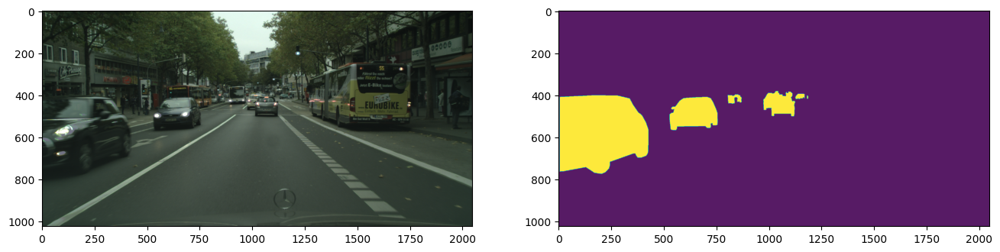

In [11]:
train_augmentation_maskrcnn = T.Compose([
    T.Resize((512,1024)),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    # T.RandomSolarize(threshold=20.0),
    T.RandomGrayscale(p=0.2),
    T.GaussianBlur(kernel_size=7, sigma=(0.1, 2.0)),
    T.ToImage(), T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]) 
val_augmentation_maskrcnn = T.Compose([
    T.Resize((512,1024)),
    T.ToImage(), T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

path_cfg.task = "semantic"
train_dataset = CityscapesDataset(path_cfg)
img, target = train_dataset[12]
img_tensor = img
img = np.array(img)

plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.imshow(img.transpose(1, 2, 0))
print(target["labels"])
plt.subplot(122)
print(target["masks"].shape)
print(target["labels"])
plt.imshow(target["masks"][2], alpha=0.9)

BoundingBoxes([[ 373.,  354., 2001.,  563.],
               [ 441.,  401.,  457.,  474.],
               [   6.,  382., 1186.,  775.],
               [ 577.,  237., 1754.,  558.],
               [ 443.,  426.,  456.,  471.]], format=BoundingBoxFormat.XYXY, canvas_size=[1024, 2048])
[0 1 2 3 5 8]


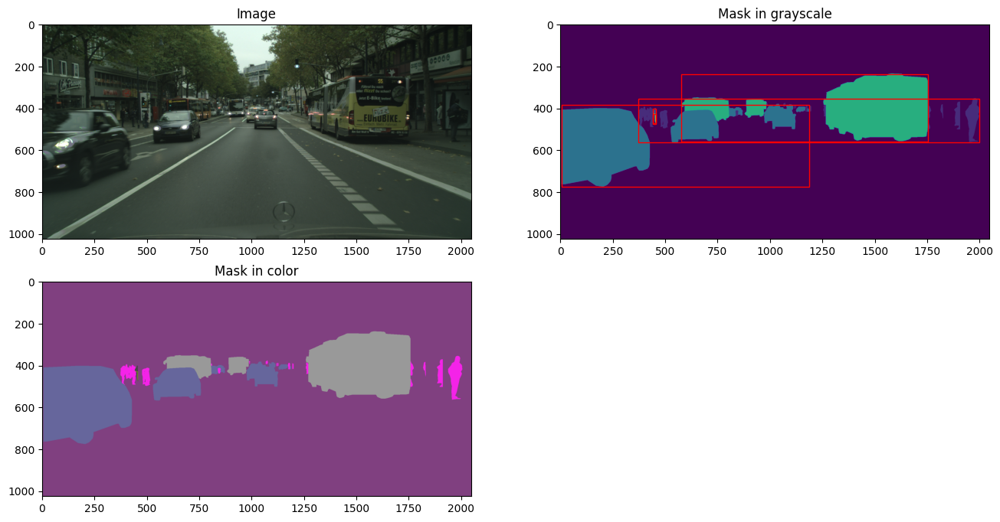

In [13]:
from matplotlib.patches import Rectangle

img, target = train_dataset[12]
img_tensor = img
img = np.array(img)
# target['boxes'] = sv.mask_to_xyxy(target['masks'])
# print(target['boxes'])
plt.figure(figsize=(16, 8))
plt.subplot(2, 2, 1)
plt.title("Image")
plt.imshow(img.transpose(1, 2, 0))





boxes = target['boxes']
print(boxes)
rects = []
for box in boxes:
    rects.append(Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=1, edgecolor='r', facecolor='none'))

plt.subplot(2, 2, 2)
plt.title("Mask in grayscale")
mask_viz = convert_instance_to_semantic(target['masks'], target['labels'])
current_axes = plt.gca()
for rect in rects:
    current_axes.add_patch(rect)
plt.imshow(mask_viz)
print(np.unique(mask_viz))




plt.subplot(2, 2, 3)
plt.title("Mask in color")
mask_viz = colorize_mask(mask_viz, class_id_to_color)

# print("_".join(train_dataset.label_images[12].split('_')[:-1]) + "_polygons.json")
# with open(("_".join(train_dataset.label_images[12].split('_')[:-1]) + "_polygons.json"), "r") as f:
#     pol_data = json.load(f)
# # print(pol_data)
# bounding_boxes = [ sv.polygon_to_xyxy(p['polygon']) for p in pol_data['objects'] ]

# rects = []
# for box in bounding_boxes:
#     rects.append(Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=1, edgecolor='r', facecolor='none'))
# current_axes = plt.gca()
# for rect in rects:
#     current_axes.add_patch(rect)
plt.imshow(mask_viz.permute(1, 2, 0))

In [14]:
def collate_fn(batch):
    """
    Since the number of objects varies per image, we collate the images and targets
    into lists. The model expects a list of images and a list of targets dictionaries.
    """
    # batch is a list of tuples: [(img1, target1), (img2, target2), ...]
    images = [item[0] for item in batch] # This will be a list of image tensors/tv_tensors.Image
    targets = [item[1] for item in batch] # This will be a list of target dictionaries
    return images, targets

def get_dataloader(dataset, config, is_train=True):
    dataloader = DataLoader(dataset, batch_size=(config.per_gpu_train_batch_size if is_train else config.per_gpu_eval_batch_size), num_workers=config.num_workers, shuffle=is_train, collate_fn = collate_fn)
    return dataloader

In [17]:
def show_loss_graph(losses):
    plt.figure(figsize=(12,8))
    plt.title("Loss over training")
    plt.plot(losses, color='b', linewidth=2)
    
    plt.xlabel("steps")
    plt.ylabel("loss value")
    plt.xlim(0, len(losses)-1)
    
    plt.grid()
    plt.legend()
    plt.show()

def show_lr_graph(lrs):
    plt.figure(figsize=(12,8))
    plt.title("Learning rate over training")
    plt.plot(lrs, color='r', linewidth=2)
    
    plt.xlabel("steps")
    plt.ylabel("learning rate")
    plt.xlim(0, len(lrs)-1)
    
    plt.grid()
    plt.legend()
    plt.show()

## Training MaskRCNN

In [ ]:
import torch
import torchvision.tv_tensors as tv_tensors
from torchvision.transforms import v2 as T
from torchvision.io import read_image
from torchvision.ops import masks_to_boxes
import numpy as np
import matplotlib.pyplot as plt
import cv2 # Used for drawing contours
import random

import sys
sys.path.append("/kaggle/working/Mask_RCNN")
from mrcnn import visualize

def visualize_predictions(model, dataset, idx=None, device='cuda', confidence_threshold=0.5):
    """
    Visualizes ground truth, predicted masks, and an overlay of both for a given sample.

    Args:
        model (torch.nn.Module): The trained Mask R-CNN model.
        dataset (Dataset): The Cityscapes dataset instance.
        idx (int, optional): The index of the sample to visualize. If None, a random index is chosen. Defaults to None.
        device (str, optional): The device to run inference on ('cuda' or 'cpu'). Defaults to 'cuda'.
        confidence_threshold (float, optional): The threshold to filter model predictions. Defaults to 0.5.
    """
    if idx is None:
        idx = random.randint(0, len(dataset) - 1)
    print(f"Visualizing sample at index: {idx}")

    # 1. Get Data and Run Inference
    model.to(device)
    model.eval()

    img, target = dataset[idx]
    
    with torch.no_grad():
        # Add a batch dimension and send to device
        model_input = img.unsqueeze(0).to(device)
        prediction = model(model_input)[0]

    # 2. Prepare Tensors for Visualization (move to CPU and convert to NumPy)
    # Convert image tensor from [C, H, W] to [H, W, C] for plotting
    img = T.Resize((512, 1024))(read_image(dataset.images[idx]))
    img_np = img.permute(1, 2, 0).cpu().numpy().astype(np.uint8)

    # Ground Truth data
    gt_masks = target['masks'].cpu().numpy()
    gt_labels = target['labels'].cpu().numpy()

    # Prediction data
    pred_scores = prediction['scores'].cpu().numpy()
    high_conf_indices = np.where(pred_scores >= confidence_threshold)[0]

    # Filter predictions based on the confidence threshold
    pred_masks = (prediction['masks'][high_conf_indices] > 0.5).squeeze(1).permute(1, 2, 0).cpu().numpy()
    pred_labels = prediction['labels'][high_conf_indices].cpu().numpy()
    pred_boxes = prediction['boxes'][high_conf_indices].cpu().numpy()
    for i in range(len(pred_boxes)):
        pred_boxes[i][0], pred_boxes[i][1] = pred_boxes[i][1], pred_boxes[i][0] # (y1, x1) instead of (x1, y1)
        pred_boxes[i][2], pred_boxes[i][3] = pred_boxes[i][3], pred_boxes[i][2] # (y2, x2) instead of (x2, y2)

    visualize.display_instances(img_np, pred_boxes, pred_masks, pred_labels, dataset.class_names)

    plt.tight_layout()
    plt.show()
    model.train()

test_dataset_for_viz = CityscapesDataset(path_cfg, val_augmentation_maskrcnn, split='train')
colors = torch.tensor(colors, dtype=torch.uint8)
print(colors.shape)

2025-09-29 08:26:20.031383: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759134380.205396      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759134380.257057      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Initialized Cityscapes dataset for 'semantic' task.
Found 2975 samples in split 'train'.
torch.Size([20, 3])


In [20]:
def train_semantic(model, train_dataset, config):
    n_total = len(train_dataset) * config.n_epochs
    model.to(config.device)
    model.train()
    train_dataloader = get_dataloader(train_dataset, config)
    optimizer = optim.AdamW(model.parameters(), lr=config.optimizer.params.lr, eps=config.optimizer.params.eps, weight_decay=config.optimizer.params.weight_decay)
    scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.99, patience=5, cooldown=3, min_lr=1e-5)

    # scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_total, eta_min=1e-6)

    scaler = None
    if config.scaler:
        scaler = torch.amp.GradScaler(config.device, enabled=True)
    step_losses = []
    lrs = []
    with tqdm(total=n_total, unit="step") as pbar:
        for epoch in range(1, config.n_epochs+1):
            epoch_loss = 0.0
            for batch in train_dataloader:
                images, targets = batch


                
                # images = torch.stack(images).to(config.device)
                images = [image.to(config.device) for image in images]
                targets = [{k: v.to(config.device) for k, v in t.items()} for t in targets]
            #     print(targets[0]['labels'])
            #     print(targets[0]['masks'].shape)
            
                with torch.amp.autocast(device_type=config.device, enabled=(scaler is not None)):
                    loss_dict = model(images, targets)
                    losses = sum(loss for loss in loss_dict.values())



                
                loss_value = losses
        
                optimizer.zero_grad()
                if scaler is not None:
                    scaler.scale(loss_value).backward()
                    scaler.step(optimizer)
                    scaler.update()
                else:
                    loss_value.backward()
                    optimizer.step()
                    
                if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                    scheduler_metric = loss_value.item()
                    scheduler.step(scheduler_metric)
                else:
                    scheduler.step()

                
                step_losses.append(loss_value.item())
                lrs.append(scheduler.get_last_lr()[0])
                epoch_loss += loss_value.item()
                pbar.update(len(images))
                pbar.set_postfix(
                    current_loss=f"{loss_value.item():.4f}",
                    avg_loss=f"{sum(step_losses)/len(step_losses):.4f}", 
                    lr=f"{scheduler.get_last_lr()[0]:.1e}"
                )
                
            # visualize here
            epoch_loss /= len(train_dataloader)
            print(f"Epoch {epoch}/{config.n_epochs+1} average loss: {epoch_loss}")
            visualize_predictions(model, test_dataset_for_viz, idx=12, device='cuda', confidence_threshold=0.5)

    torch.save({
        'epoch': config.n_epochs,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'step_losses': step_losses,
    }, "/kaggle/working/MaskRCNN_dice_ckpt10epoch.pth")

    show_loss_graph(step_losses)
    show_lr_graph(lrs)
    return model, step_losses

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth
100%|██████████| 177M/177M [00:00<00:00, 211MB/s] 


Visualizing sample at index: 12

*** No instances to display *** 



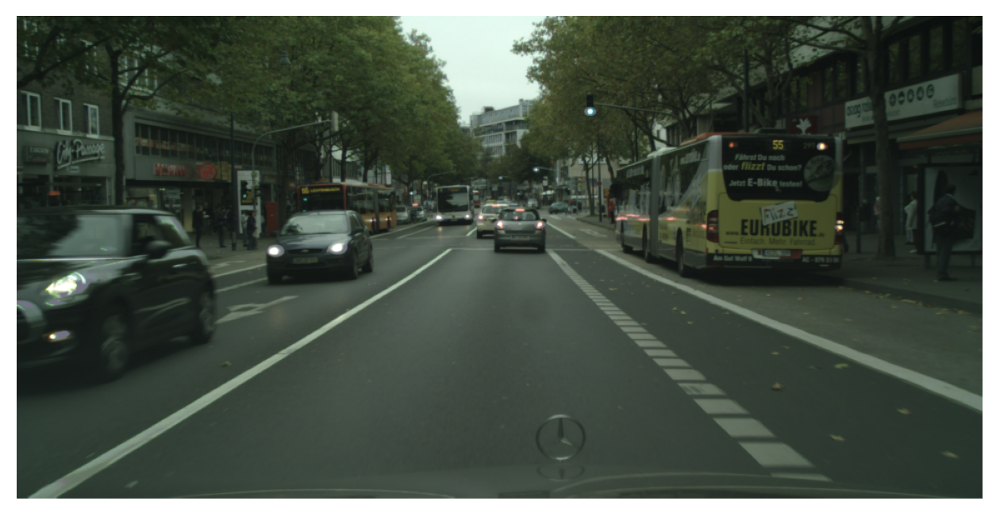

<Figure size 640x480 with 0 Axes>

Initialized Cityscapes dataset for 'semantic' task.
Found 2975 samples in split 'train'.


In [21]:
config['device'] = 'cuda' if torch.cuda.is_available() else "cpu"
config['scaler'] = 'amp'
config['per_gpu_train_batch_size'] = 6 # if 1 gpu -> dont have to be power of 2
config['n_epochs'] = 5
config.optimizer.params.lr = 2e-4
model = build_model(model_cfg, 3, 9)
visualize_predictions(model, test_dataset_for_viz, idx=12, device='cuda', confidence_threshold=0.5)
train_dataset = CityscapesDataset(path_cfg, train_augmentation_maskrcnn)

 20%|██        | 2975/14875 [10:32<39:47,  4.98step/s, avg_loss=0.7552, current_loss=0.3919, lr=1.2e-04] 

Epoch 1/6 average loss: 0.7552322086787993
Visualizing sample at index: 12


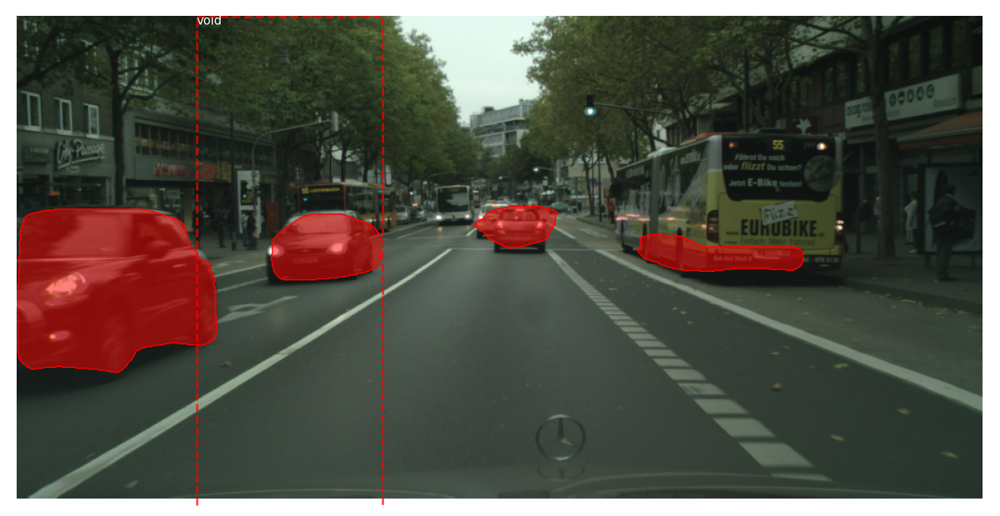

<Figure size 640x480 with 0 Axes>

 40%|████      | 5950/14875 [21:05<29:56,  4.97step/s, avg_loss=0.7043, current_loss=0.4684, lr=7.0e-05]  

Epoch 2/6 average loss: 0.6532813492080858
Visualizing sample at index: 12


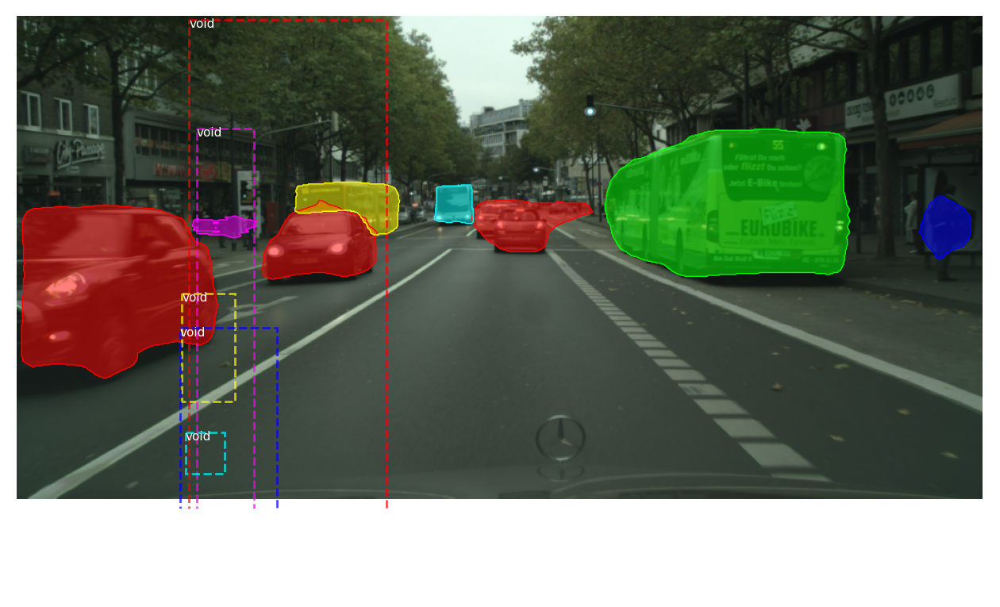

<Figure size 640x480 with 0 Axes>

 60%|██████    | 8925/14875 [31:42<20:04,  4.94step/s, avg_loss=0.6748, current_loss=0.6741, lr=4.0e-05]  

Epoch 3/6 average loss: 0.615961157506512
Visualizing sample at index: 12


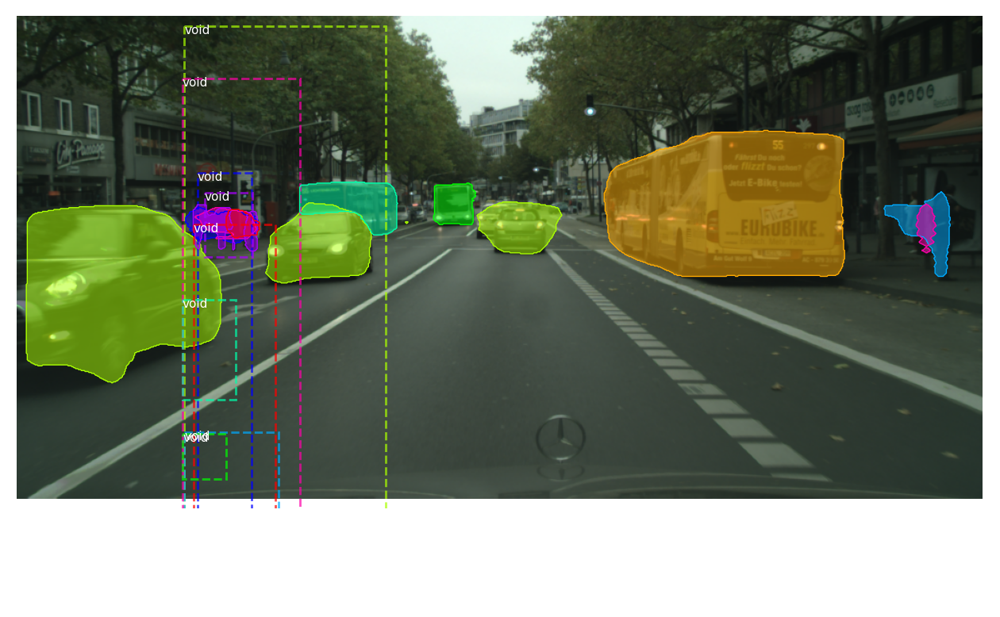

<Figure size 640x480 with 0 Axes>

 80%|████████  | 11900/14875 [42:20<10:16,  4.82step/s, avg_loss=0.6547, current_loss=0.6383, lr=2.3e-05]

Epoch 4/6 average loss: 0.5943232079547259
Visualizing sample at index: 12


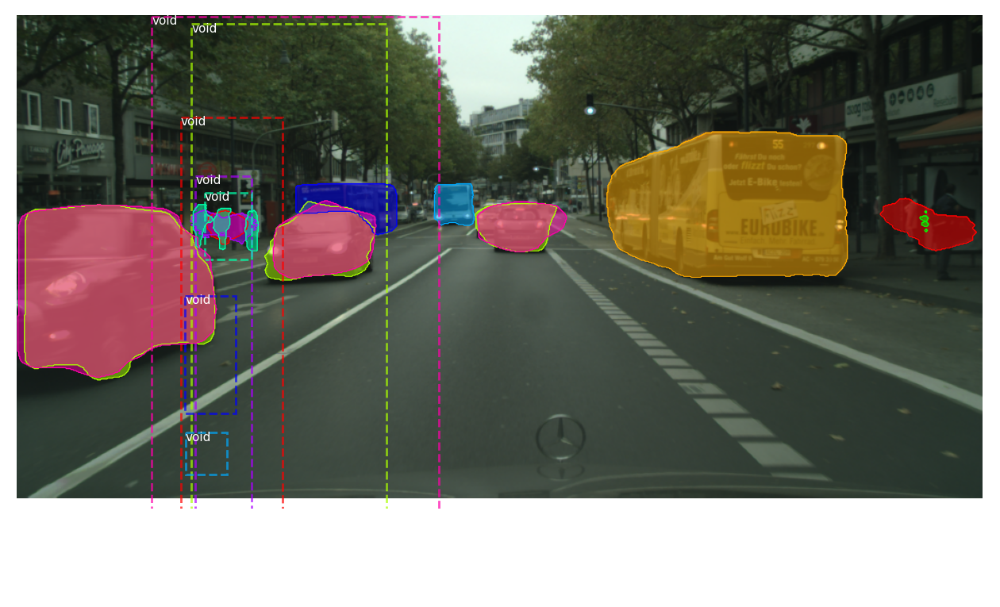

<Figure size 640x480 with 0 Axes>

100%|██████████| 14875/14875 [52:59<00:00,  4.88step/s, avg_loss=0.6391, current_loss=0.5784, lr=1.3e-05]

Epoch 5/6 average loss: 0.5766249929945315
Visualizing sample at index: 12


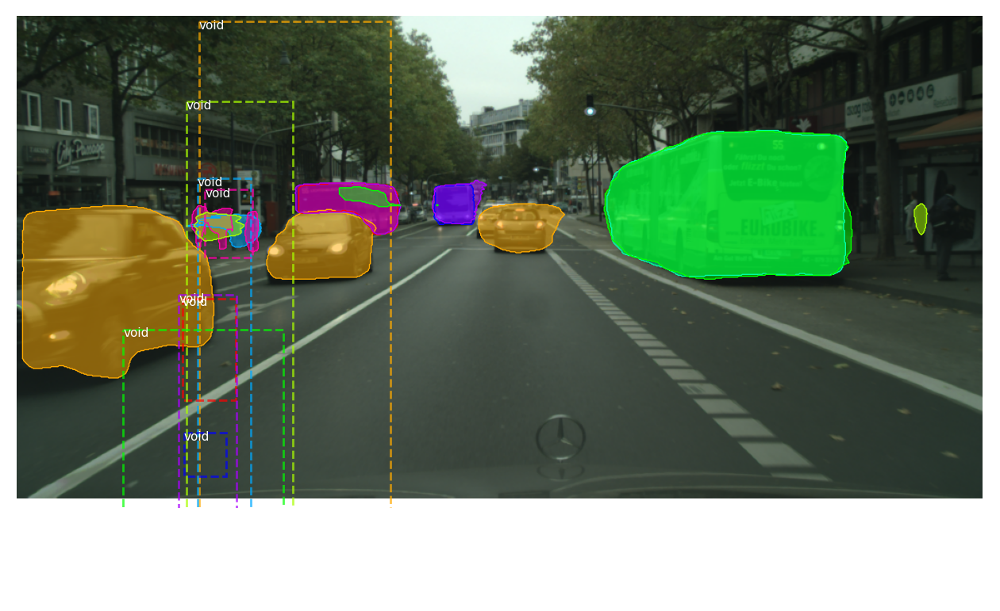

<Figure size 640x480 with 0 Axes>

100%|██████████| 14875/14875 [53:01<00:00,  4.68step/s, avg_loss=0.6391, current_loss=0.5784, lr=1.3e-05]


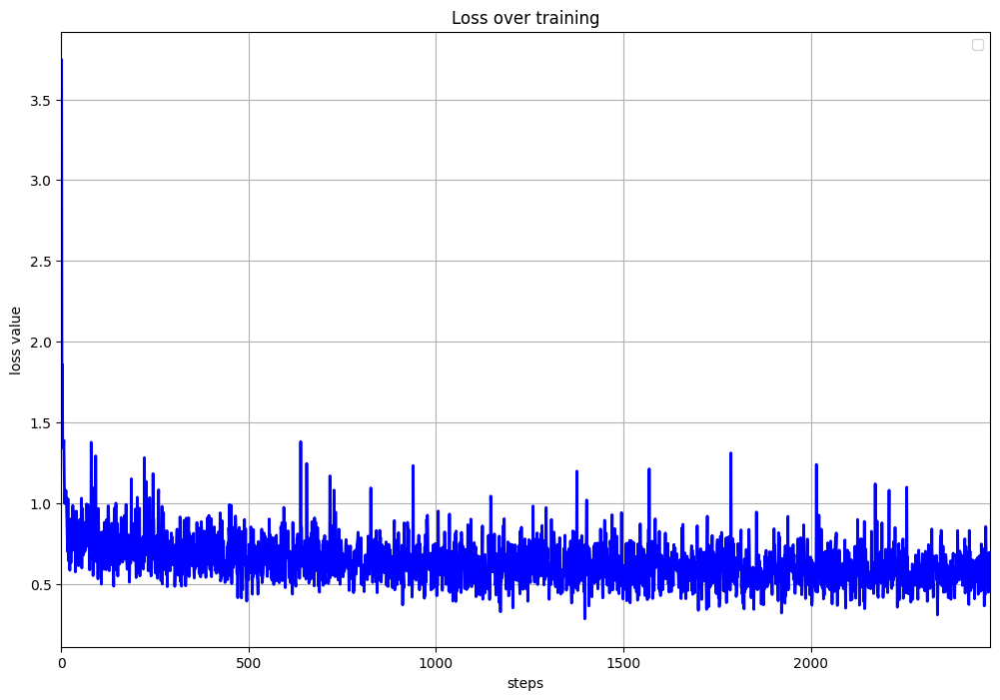

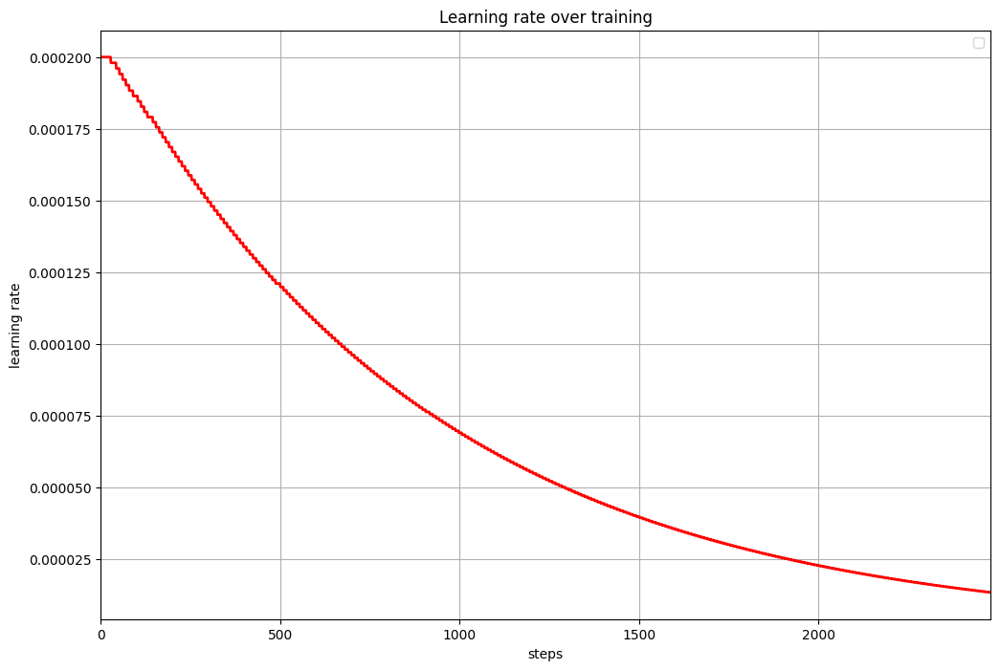

In [22]:
maskrcnn_model, step_losses = train_semantic(model, train_dataset, config)

In [22]:
# torch.save({
#     'epoch': config.n_epochs,
#     'model_state_dict': maskrcnn_model.state_dict(),
#     'optimizer_state_dict': optimizer.state_dict(),
#     'step_losses': step_losses,
# }, "/kaggle/working/MaskRCNN_ckpt3epoch.pth")

## Training UNet

In [23]:
train_augmentation_unet = T.Compose([
    T.Resize((512,1024)),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    # T.RandomSolarize(threshold=20.0),
    T.RandomGrayscale(p=0.2),
    T.GaussianBlur(kernel_size=7, sigma=(0.1, 2.0)),
    T.ToImage(), T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]) 
val_augmentation_unet = T.Compose([
    T.Resize((512,1024)),
    T.ToImage(), T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [24]:
def collate_fn(batch):
    """
    Since the number of objects varies per image, we collate the images and targets
    into lists. The model expects a list of images and a list of targets dictionaries.
    """
    # batch is a list of tuples: [(img1, target1), (img2, target2), ...]
    images = [item[0] for item in batch] # This will be a list of image tensors/tv_tensors.Image
    targets = [item[1] for item in batch] # This will be a list of target dictionaries
    return images, targets

def get_dataloader(dataset, config, is_train=True):
    dataloader = DataLoader(dataset, batch_size=config.per_gpu_train_batch_size, num_workers=config.num_workers, shuffle=is_train, collate_fn = collate_fn)
    return dataloader

In [25]:
test_dataset_for_viz = CityscapesDataset(path_cfg, val_augmentation_unet, split='val')
image_idx_to_viz = 2
original_image_viz = read_image(test_dataset_for_viz.images[image_idx_to_viz]).to(torch.uint8)

Initialized Cityscapes dataset for 'semantic' task.
Found 500 samples in split 'val'.


In [26]:
def visualize_unet(unet_model):
    """
    Loads a sample, runs inference, and displays the original image,
    ground truth mask, and predicted mask side-by-side.
    """
    unet_model.eval()
    with torch.no_grad():
        # 1. Get data from the dataset
        image_tensor, target_dict = test_dataset_for_viz[image_idx_to_viz]
        
        # Get the instance masks and labels from the target dictionary
        gt_instance_masks = target_dict['masks']   # Shape: [N_instances, H, W]
        gt_instance_labels = target_dict['labels'] # Shape: [N_instances]
        
        # Convert the instance ground truth to a single semantic mask
        gt_semantic_mask = convert_instance_to_semantic(gt_instance_masks, gt_instance_labels)
    
        # 2. Prepare image for the model and run inference
        input_tensor = image_tensor.unsqueeze(0).to(config.device)
        logits = unet_model(input_tensor)
        
        # 3. Process the prediction: Use argmax (this part was already correct)
        pred_semantic_mask = torch.argmax(logits.squeeze(0), dim=0).cpu()
    
    # Colorize the ground truth and prediction masks
    gt_color_mask = colorize_mask(gt_semantic_mask, class_trainId_to_color)
    pred_color_mask = colorize_mask(pred_semantic_mask, class_trainId_to_color)
    
    # 5. Display the results
    plt.figure(figsize=(24, 8))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_image_viz.permute(1, 2, 0))
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(gt_color_mask.permute(1, 2, 0))
    plt.title("Ground Truth")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(pred_color_mask.permute(1, 2, 0))
    plt.title("U-Net Prediction")
    plt.axis('off')
    
    import matplotlib.patches as mpatches
    legend_patches = []
    # Sort by ID for a consistent legend order
    for class_id in sorted(class_trainId_to_color.keys()):
        if class_id != 0: # Don't include the ignore label in the legend
            name = class_trainId_to_color[class_id]
            color = np.array(class_trainId_to_color[class_id]) / 255.0 # Matplotlib expects colors in [0, 1] range
            patch = mpatches.Patch(color=color, label=f"{class_id}: {name}")
            legend_patches.append(patch)
    
    # Add legend to the side of the plots
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.0, 0.9), loc='upper left')
    plt.show()
    unet_model.train()

In [27]:
def train_semantic(model, train_dataset, config):
    n_total = len(train_dataset) * config.n_epochs
    model.to(config.device)
    model.train()

    train_dataloader = get_dataloader(train_dataset, config)
    optimizer = optim.AdamW(model.parameters(), lr=config.optimizer.params.lr, eps=config.optimizer.params.eps, weight_decay=config.optimizer.params.weight_decay)
    scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.99, patience=4, cooldown=2, min_lr=1e-5)
    # scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_total, eta_min=1e-5)

    combined_loss = DiceFocalCELoss([0.3, 0.3, 0.4], ignore_index=0, alpha=0.25, gamma=2)

    scaler = None
    if config.scaler:
        scaler = torch.amp.GradScaler(config.device, enabled=True)
    step_losses = []
    lrs = []
    with tqdm(total=n_total, unit="step") as pbar:
        for epoch in range(1, config.n_epochs+1):
            epoch_loss = 0.0
            for batch in train_dataloader:
                images, targets = batch
                images = torch.stack(images).to(config.device) # [B, 3, H, W]
                # images = [image.to(config.device) for image in images]
                # instance_masks = torch.stack([t["masks"] for t in targets]).long() # [B, ?, H, W]
                # print("sample 0: ", targets[0]['labels'], targets[0]['masks'])
                semantic_masks = [convert_instance_to_semantic(t['masks'], t['labels']) for t in targets]
                semantic_masks = torch.stack(semantic_masks).squeeze(1).long() # [B, H, W]

                with torch.amp.autocast(device_type=config.device, enabled=(scaler is not None)):
                    predicted_masks = model(images) # [B, 9, H, W] 0...8
                    predicted_masks = predicted_masks.cpu().float()
                    
                    # [B, 8, H, W]: 0..7 represent 1..8
                    onehot_masks = torch.zeros((semantic_masks.shape[0], model.n_classes-1, semantic_masks.shape[1], semantic_masks.shape[2]), dtype=torch.long)
                    for i in range(semantic_masks.shape[0]):
                        for class_id in range(model.n_classes-1):
                            if class_id in  targets[i]['labels']:
                                onehot_masks[i, class_id, ...] = (semantic_masks[i] == class_id+1).long()
                    # print("shape before : ", predicted_masks.shape, onehot_masks.shape, semantic_masks.shape)
                    losses = combined_loss(predicted_masks, onehot_masks, semantic_masks) 
                    loss_value = losses['ce'] + losses['dl'] + losses['fc']
        
                optimizer.zero_grad()
                if scaler is not None:
                    scaler.scale(loss_value).backward()
                    scaler.step(optimizer)
                    scaler.update()
                else:
                    losses.backward()
                    optimizer.step()
                    
                if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                    scheduler_metric = loss_value.item()
                    scheduler.step(scheduler_metric)
                else:
                    scheduler.step()

                step_losses.append(loss_value.half().item())
                epoch_loss += loss_value.item()
                pbar.update(len(images))
                pbar.set_postfix(
                    current_loss=f"{loss_value.item():.4f}",
                    avg_loss=f"{sum(step_losses)/len(step_losses):.4f}", 
                    lr=f"{scheduler.get_last_lr()[0]:.1e}"
                )

            # visualize here
            epoch_loss /= len(train_dataloader)
            print(f"Epoch {epoch}/{config.n_epochs+1} loss: {epoch_loss}")
            visualize_unet(model)
            
    torch.save({
        'epoch': config.n_epochs,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'step_losses': step_losses,
    }, "/kaggle/working/UNet_dice_ckpt10epoch.pth")
    show_loss_graph(step_losses)
    show_lr_graph(lrs)
    return model, step_losses

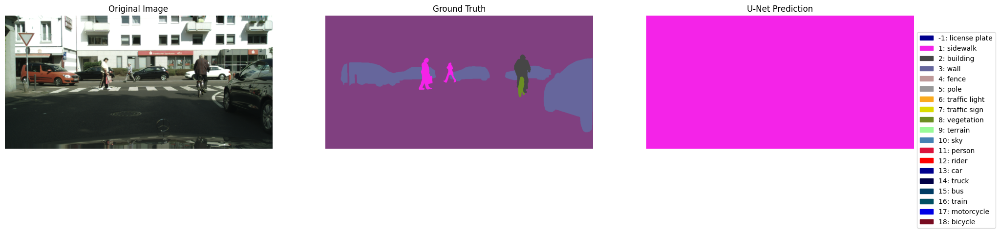

Initialized Cityscapes dataset for 'semantic' task.
Found 2975 samples in split 'train'.


In [28]:

config['device'] = 'cuda' if torch.cuda.is_available() else "cpu"
config['scaler'] = 'amp'
config['per_gpu_train_batch_size'] = 4 # if 1 gpu -> dont have to be power of 2
config['n_epochs'] = 3

model_cfg.model_name = 'UNet'
model = build_model(model_cfg, 3, 9).to(config.device)
visualize_unet(model)
train_dataset = CityscapesDataset(path_cfg, train_augmentation_unet)

 33%|███▎      | 2975/8925 [28:24<50:55,  1.95step/s, avg_loss=0.6766, current_loss=0.5378, lr=1.1e-04]  

Epoch 1/4 loss: 0.6766293765876883


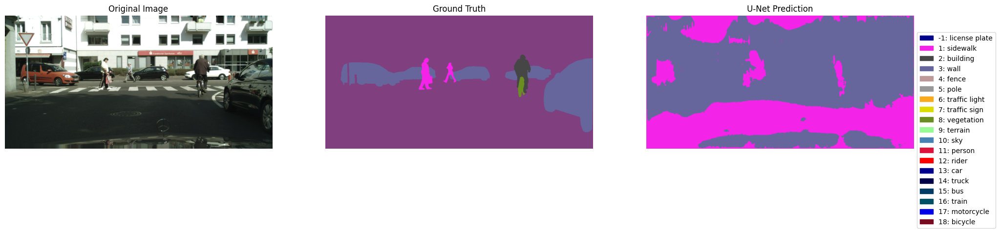

 67%|██████▋   | 5950/8925 [57:32<25:28,  1.95step/s, avg_loss=0.6350, current_loss=0.5209, lr=3.8e-05]  

Epoch 2/4 loss: 0.5934062276876741


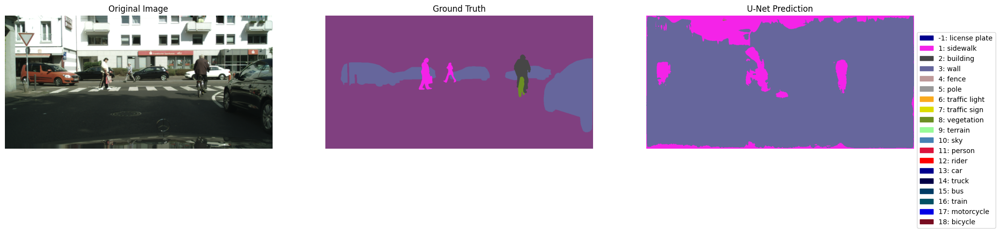

100%|██████████| 8925/8925 [1:26:21<00:00,  1.92step/s, avg_loss=0.6166, current_loss=0.4492, lr=1.3e-05]

Epoch 3/4 loss: 0.5796998361506129


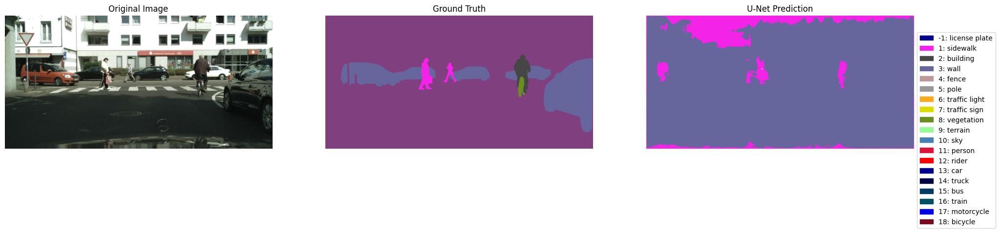

100%|██████████| 8925/8925 [1:26:22<00:00,  1.72step/s, avg_loss=0.6166, current_loss=0.4492, lr=1.3e-05]


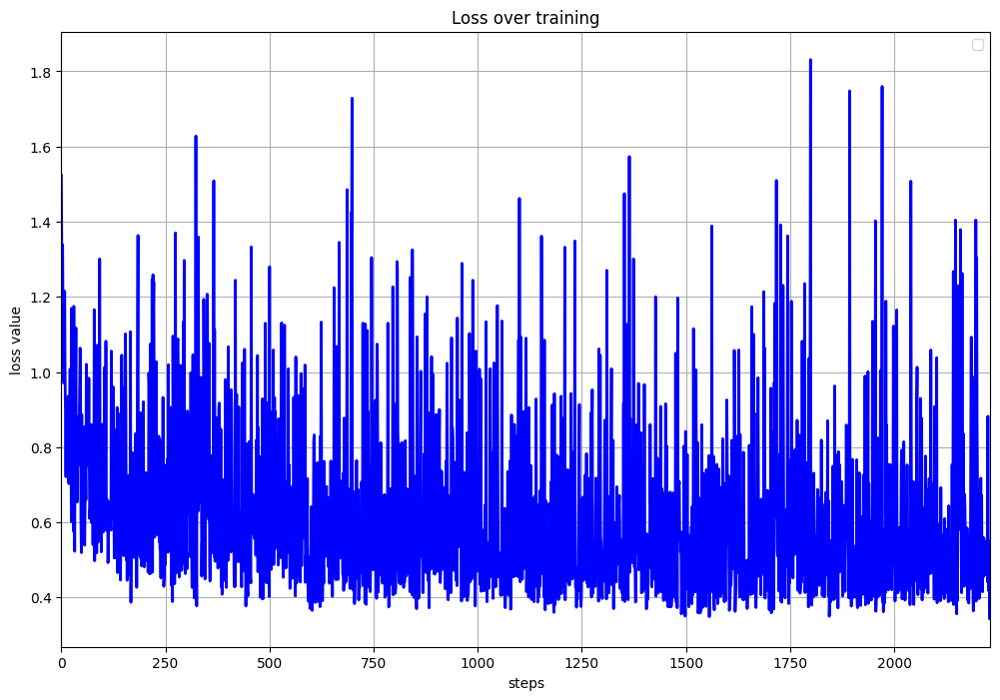

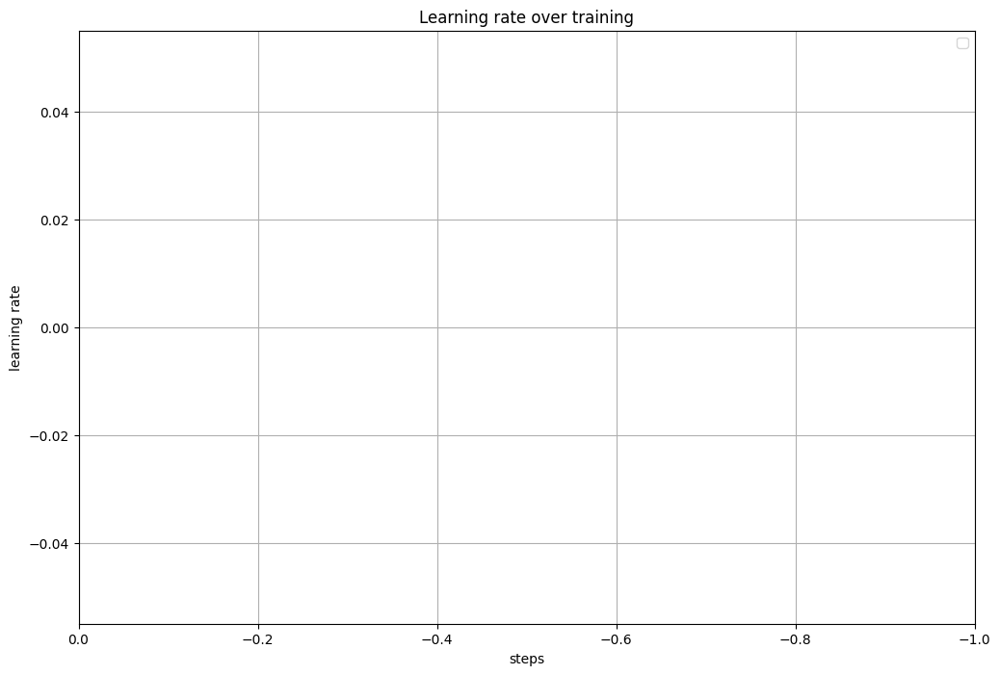

In [29]:
unet_model, step_losses = train_semantic(model, train_dataset, config)


output: B 20 H W

target[mask]: B ? H W

cross_entropy: B N H W -> logits input and bin mask target

multiclass: B N H W yes; B H W no

In [30]:
asd'as'd'

SyntaxError: unterminated string literal (detected at line 1) (2301012473.py, line 1)

# Validation

In [ ]:

# model_cfg.model_name = 'MaskRCNN'
# maskrcnn_model = build_model(model_cfg, 3, 9)

# weights_dict = torch.load("/kaggle/input/segmentation_cityscapes/pytorch/v01/7/MaskRCNN_9c_ckpt5epoch.pth", map_location=config.device)
# maskrcnn_model.load_state_dict(weights_dict["model_state_dict"])
# maskrcnn_model.to(config.device)
# print("Load maskrcnn complete!")

In [ ]:

# model_cfg.model_name = 'UNet'
# unet_model = build_model(model_cfg, 3, 9)
# weights_dict = torch.load("/kaggle/input/segmentation_cityscapes/pytorch/v01/7/UNet_9c_ckpt4epoch.pth", map_location=config.device)
# unet_model.load_state_dict(weights_dict["model_state_dict"])
# unet_model.to(config.device)
# print("Load unet complete!")

In [ ]:
# https://github.com/matterport/Mask_RCNN

def compute_overlaps_masks(masks1, masks2):
    """Computes IoU overlaps between two sets of masks.
    masks1, masks2: [Height, Width, instances]
    """
    
    # If either set of masks is empty return empty result
    if masks1.shape[-1] == 0 or masks2.shape[-1] == 0:
        return np.zeros((masks1.shape[-1], masks2.shape[-1]))
        
    # flatten masks and compute their areas
    masks1 = np.reshape(masks1 > .5, (-1, masks1.shape[-1])).astype(np.float32)
    masks2 = np.reshape(masks2 > .5, (-1, masks2.shape[-1])).astype(np.float32)
    area1 = np.sum(masks1, axis=0)
    area2 = np.sum(masks2, axis=0)
    # intersections and union
    intersections = np.dot(masks1.T, masks2)
    union = area1[:, None] + area2[None, :] - intersections
    overlaps = intersections / union
    
    return overlaps

def trim_zeros(x):
    """It's common to have tensors larger than the available data and
    pad with zeros. This function removes rows that are all zeros.

    x: [rows, columns].
    """
    assert len(x.shape) == 2
    return x[~np.all(x == 0, axis=1)]
    
def compute_matches(gt_boxes, gt_class_ids, gt_masks,
                    pred_boxes, pred_class_ids, pred_scores, pred_masks,
                    iou_threshold=0.5, score_threshold=0.1): # low score threshold
    """Finds matches between prediction and ground truth instances.

    Returns:
        gt_match: 1-D array. For each GT box it has the index of the matched
                  predicted box.
        pred_match: 1-D array. For each predicted box, it has the index of
                    the matched ground truth box.
        overlaps: [pred_boxes, gt_boxes] IoU overlaps.
    """
    # Trim zero padding
    # TODO: cleaner to do zero unpadding upstream
    # gt_boxes = trim_zeros(gt_boxes)
    gt_masks = gt_masks[..., :gt_boxes.shape[0]]
    # pred_boxes = trim_zeros(pred_boxes)
    pred_scores = pred_scores[:pred_boxes.shape[0]]
    # Sort predictions by score from high to low
    indices = np.argsort(pred_scores)[::-1].copy()
    pred_boxes = pred_boxes[indices]
    pred_class_ids = pred_class_ids[indices]
    pred_scores = pred_scores[indices]
    pred_masks = pred_masks[..., indices]

    # Compute IoU overlaps [pred_masks, gt_masks]
    overlaps = compute_overlaps_masks(pred_masks, gt_masks)
    # print(overlaps.shape)
    # plt.figure(figsize=(15, 18))
    # plt.imshow(overlaps, interpolation='nearest', cmap=plt.cm.Blues)
    # plt.colorbar()
    
    # tick_marks_gt = np.arange(len(gt_class_ids))
    # tick_marks = np.arange(len(pred_class_ids))
    # plt.xticks(tick_marks_gt, gt_class_ids, rotation=45)
    # plt.yticks(tick_marks, pred_class_ids)
    
    # # Adding text annotations
    # for i in range(overlaps.shape[0]):
    #     for j in range(overlaps.shape[1]):
    #         plt.text(j, i, format(overlaps[i, j], 'f'),
    #                  horizontalalignment="center",
    #                  color="white" if overlaps[i, j] > overlaps.max() / 2 else "black")
    
    # plt.ylabel('Predicted Label')
    # plt.xlabel('True Label')
    # plt.tight_layout()
    # plt.show()


    # Loop through predictions and find matching ground truth boxes
    match_count = 0
    pred_match = -1 * np.ones([pred_boxes.shape[0]])
    gt_match = -1 * np.ones([gt_boxes.shape[0]])
    for i in range(len(pred_boxes)):
        # Find best matching ground truth box
        # 1. Sort matches by score
        sorted_ixs = np.argsort(overlaps[i])[::-1]
        # 2. Remove low scores
        low_score_idx = np.where(overlaps[i, sorted_ixs] < score_threshold)[0]
        if low_score_idx.size > 0:
            sorted_ixs = sorted_ixs[:low_score_idx[0]]
        # 3. Find the match
        for j in sorted_ixs:
            # If ground truth box is already matched, go to next one
            if gt_match[j] > -1:
                continue
            # If we reach IoU smaller than the threshold, end the loop
            iou = overlaps[i, j]
            if iou < iou_threshold:
                break
            # Do we have a match?
            if pred_class_ids[i] == gt_class_ids[j]:
                match_count += 1
                gt_match[j] = i
                pred_match[i] = j
                break

    return gt_match, pred_match, overlaps


def compute_ap(gt_boxes, gt_class_ids, gt_masks,
               pred_boxes, pred_class_ids, pred_scores, pred_masks,
               iou_threshold=0.5):
    """Compute Average Precision at a set IoU threshold (default 0.5).
    gt_boxes, pred_boxes : (N, 4)
    gt_class_ids, pred_class_ids : (N)
    gt_masks, pred_masks : (H, W, N)

    Returns:
    mAP: Mean Average Precision
    precisions: List of precisions at different class score thresholds.
    recalls: List of recall values at different class score thresholds.
    overlaps: [pred_boxes, gt_boxes] IoU overlaps.
    """
    # Get matches and overlaps
    gt_match, pred_match, overlaps = compute_matches(
        gt_boxes, gt_class_ids, gt_masks,
        pred_boxes, pred_class_ids, pred_scores, pred_masks,
        iou_threshold)

    # Compute precision and recall at each prediction box step
    precisions = np.cumsum(pred_match > -1) / (np.arange(len(pred_match)) + 1)
    recalls = np.cumsum(pred_match > -1).astype(np.float32) / len(gt_match)

    # Pad with start and end values to simplify the math
    precisions = np.concatenate([[0], precisions, [0]])
    recalls = np.concatenate([[0], recalls, [1]])
    # Ensure precision values decrease but don't increase. This way, the
    # precision value at each recall threshold is the maximum it can be
    # for all following recall thresholds, as specified by the VOC paper.
    for i in range(len(precisions) - 2, -1, -1):
        precisions[i] = np.maximum(precisions[i], precisions[i + 1])

    # Compute mean AP over recall range
    indices = np.where(recalls[:-1] != recalls[1:])[0] + 1
    mAP = np.sum((recalls[indices] - recalls[indices - 1]) *
                 precisions[indices])

    return mAP, precisions, recalls, overlaps

def compute_ap_range(gt_box, gt_class_id, gt_mask,
                     pred_box, pred_class_id, pred_score, pred_mask,
                     iou_thresholds=None, verbose=1):
    """Compute AP over a range or IoU thresholds. Default range is 0.5-0.95."""
    # Default is 0.5 to 0.95 with increments of 0.05
    iou_thresholds = iou_thresholds or np.arange(0.5, 1.0, 0.05)
    
    # Compute AP over range of IoU thresholds
    AP = []
    for iou_threshold in iou_thresholds:
        ap, precisions, recalls, overlaps =\
            compute_ap(gt_box, gt_class_id, gt_mask,
                        pred_box, pred_class_id, pred_score, pred_mask,
                        iou_threshold=iou_threshold)
        if verbose:
            print("AP @{:.2f}:\t {:.3f}".format(iou_threshold, ap))
        AP.append(ap)
    AP = np.array(AP).mean()
    if verbose:
        print("AP @{:.2f}-{:.2f}:\t {:.3f}".format(
            iou_thresholds[0], iou_thresholds[-1], AP))
    return AP

In [ ]:
def evaluate_maskrcnn_model(model, dataloader, device, num_classes, mIoU_metric):
    """
    Evaluates a Mask R-CNN model on a derived SEMANTIC task using MeanIoU.
    This is a non-standard evaluation for Mask R-CNN but useful for comparison.
    It correctly ignores the class index 255.
    """
    print('Evaluating Mask R-CNN for Semantic mIoU...')
    model.eval()
    
    mAP = 0.0
    mAP50 = 0.0
    cnt = 0
    no_lbl_9c = 0
    with torch.no_grad():
        with tqdm(total=len(dataloader), leave=False) as pbar:
            for images, targets in dataloader:
                images = list(image.to(device) for image in images)
                img_height, img_width = images[0].shape[-2:]
                cnt += len(images)
                
                predictions = model(images)

                pred_masks_batch = []
                gt_masks_batch = []
                # pred_boolean_map_batch = []
                for i in range(len(images)):
                    if targets[i]['labels'].shape[0] == 1:
                        print(targets[i]['labels'])
                        continue
                    # img_height, img_width = images[i].shape[-2:] 
                    
                    # prediction
                    predicted_class_map = torch.full(
                        (img_height, img_width),
                        fill_value=0, 
                        dtype=torch.long,
                        device=device
                    )

                    image_predictions = predictions[i]
                    pred_masks_i = image_predictions['masks'].clone()   # [N_pred, 1, H_img, W_img]
                    pred_labels_i = image_predictions['labels'].clone() # [N_pred]
                    pred_scores_i = image_predictions['scores'].clone() # [N_pred]

                    if pred_masks_i.numel() > 0:
                        # Squeeze the channel dimension: [N_pred, H_img, W_img]
                        pred_masks_i = pred_masks_i.squeeze(1)

                        # Sort predictions by score in ascending order
                        sorted_indices = torch.argsort(pred_scores_i, descending=False)
                        pred_masks_i = pred_masks_i[sorted_indices]
                        pred_labels_i = pred_labels_i[sorted_indices]

                        for j in range(pred_masks_i.shape[0]):
                            mask_j = (pred_masks_i[j] >= 0.5)
                            label_j = pred_labels_i[j]

                            if label_j < num_classes:
                                predicted_class_map[mask_j] = label_j # gradually replaced by class with higher score
                                
                    pred_masks_batch.append(predicted_class_map)

                    # pred_labels_mask = torch.unique(predicted_class_map)
                    # boolean_instance_mask = (predicted_class_map == pred_labels_mask[:, None, None]).bool()
                    # pred_boolean_map_batch.append(boolean_instance_mask)

                    # Ground truth
                    ground_truth_semantic_map = torch.full(
                        (img_height, img_width),
                        fill_value=0,
                        dtype=torch.long,
                        device=device
                    )

                    image_targets = targets[i]
                    gt_masks_i = image_targets['masks'].clone()   # [N_gt, H_img, W_img] (0 or 1)
                    gt_labels_i = image_targets['labels'].clone() # [N_gt]

                    if gt_masks_i.numel() > 0:
                        for j in range(gt_masks_i.shape[0]):
                            mask_j = (gt_masks_i[j] == 1)
                            label_j = gt_labels_i[j]

                            if label_j < num_classes:
                                ground_truth_semantic_map[mask_j] = label_j

                    gt_masks_batch.append(ground_truth_semantic_map)

                # Stack the processed masks from the batch and update the mIoU_metric
                # pred_masks_batch is a list of [H, W] tensors -> stacks to [B, H, W]
                # gt_masks_batch is a list of [H, W] tensors -> stacks to [B, H, W]
                pred_masks_batch = torch.stack(pred_masks_batch).cpu()
                gt_masks_batch = torch.stack(gt_masks_batch).cpu()
                
                # # ===================================================== Calculate mIoU =====================================================
                if len(pred_masks_batch) > 0 and len(gt_masks_batch) > 0:
                    mIoU_metric.update(pred_masks_batch, gt_masks_batch)
                    
                # ===================================================== Calculate mAP =====================================================
                for i in range(len(predictions)):
                    if targets[i]['labels'].shape[0] == 1:
                        no_lbl_9c += 1
                        continue
                    target_mask = targets[i]['masks'][1:, ...].to('cpu').permute(1, 2, 0)
                    target_mask = np.array(target_mask).astype(bool)
                    targets[i] = {k: np.array(v[1:, ...].to('cpu')) for k, v in targets[i].items()}
                    
                    pred = predictions[i]
                    pred_scores = pred['scores'].cpu().numpy()
                    high_conf_indices = np.where(pred_scores >= 0.5)[0]
                    pred_scores = pred_scores[high_conf_indices]
                    pred_masks = (pred['masks'][high_conf_indices] > 0.5).squeeze(1).permute(1, 2, 0).cpu().numpy()
                    pred_labels = pred['labels'][high_conf_indices].cpu().numpy()
                    pred_boxes = pred['boxes'][high_conf_indices].cpu().numpy()

                    # print(pred_labels)
                    # print(targets[i]['labels'])

                    # plt.figure(figsize=(16, 8))
                    # plt.subplot(221)
                    # print(pred_masks[..., 0].shape)
                    # p1 = pred_masks[..., 0].copy().astype(float)
                    # plt.hist(p1.reshape(-1))
                    # plt.subplot(222)
                    # p1 = pred_masks[..., 1].copy().astype(float)
                    # plt.hist(p1.reshape(-1))
                    # plt.subplot(223)
                    # p1 = pred_masks[..., 2].copy().astype(float)
                    # plt.hist(p1.reshape(-1))
                    # plt.subplot(224)
                    # p1 = pred_masks[..., 3].copy().astype(float)
                    # plt.hist(p1.reshape(-1))
                    # plt.show()

                    # pred_labels = (lambda x: x-1)(pred_labels) # from 1-indexed to 0-indexed
                    # targets[i]['labels'] = (lambda x: x-1)(targets[i]['labels']) # from 1-indexed to 0-indexed
                    # if cnt == 72: 
                    #     print("target: ", targets[i]['labels'])
                    #     print(pred_labels)
                    #     img = T.Resize((512, 1024))(read_image(val_dataset.images[(cnt-1) * 4 + i]))
                    #     img_np = img.permute(1, 2, 0).cpu().numpy().astype(np.uint8)
                    #     visualize.display_instances(img_np, pred_boxes, pred_masks, pred_labels, class_names_9c)

                    mAP50 += compute_ap_range(targets[i]['boxes'], targets[i]['labels'], target_mask,
                                        pred_boxes, pred_labels, pred_scores, pred_masks,
                                        iou_thresholds=[0.5], verbose=0)
                    
                    mAP += compute_ap_range(targets[i]['boxes'], targets[i]['labels'], target_mask,
                                        pred_boxes, pred_labels, pred_scores, pred_masks,
                                        iou_thresholds=None, verbose=0)
                    
                pbar.update(1)
                pbar.set_postfix(iou=f"{mIoU_metric.compute():.4f}", mAP50=f"{mAP50/(cnt - no_lbl_9c):.2f}", mAP=f"{mAP/(cnt - no_lbl_9c):.2f}")
                # if cnt >= 1:
                #     break

    val_miou = mIoU_metric.compute()
    # val_mAP = mAP_metric.compute()
    mAP50 /= (cnt - no_lbl_9c)
    mAP /= (cnt - no_lbl_9c)
    # dl /= cnt
    model.train()
    return val_miou, mAP50, mAP

In [ ]:
from torchmetrics.segmentation import MeanIoU

val_dataset = CityscapesDataset(path_cfg, val_augmentation_maskrcnn, split='val')
config['per_gpu_eval_batch_size'] = 4
val_dataloader = get_dataloader(val_dataset, config, is_train=False)
mIoU_metric = MeanIoU(num_classes=9, include_background=False).to(config.device)
MasRCNN_val_miou, MasRCNN_val_mAP50, MasRCNN_val_mAP = evaluate_maskrcnn_model(maskrcnn_model, val_dataloader, config.device, 9, mIoU_metric)
print(MasRCNN_val_miou)
print(MasRCNN_val_mAP50, MasRCNN_val_mAP)

Initialized Cityscapes dataset for 'semantic' task.
Found 500 samples in split 'val'.


NameError: name 'evaluate_maskrcnn_model' is not defined

In [ ]:
import random
import colorsys

# Original: https://github.com/matterport/Mask_RCNN
def random_colors(N, bright=True):
    """
    Generate random colors.
    To get visually distinct colors, generate them in HSV space then
    convert to RGB.
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors

# Original: https://github.com/matterport/Mask_RCNN
def apply_mask(image, mask, color, alpha=0.5):
    """Apply the given mask to the image.
    """
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c],
                                  image[:, :, c])
    return image

# Original: https://github.com/matterport/Mask_RCNN
def display_instances(image, boxes, masks, class_ids, class_names,
                      scores=None, title="",
                      figsize=(16, 16), ax=None,
                      show_mask=True, show_bbox=False,
                      colors=None, captions=None):
    """
    boxes: [num_instance, (y1, x1, y2, x2, class_id)] in image coordinates.
    masks: [height, width, num_instances]
    class_ids: [num_instances]
    class_names: list of class names of the dataset
    scores: (optional) confidence scores for each box
    title: (optional) Figure title
    show_mask, show_bbox: To show masks and bounding boxes or not
    figsize: (optional) the size of the image
    colors: (optional) An array or colors to use with each object
    captions: (optional) A list of strings to use as captions for each object
    """
    # Number of instances
    N = boxes.shape[0]
    if not N:
        print("\n*** No instances to display *** \n")
    else:
        assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

    # If no axis is passed, create one and automatically call show()
    auto_show = False
    if not ax:
        _, ax = plt.subplots(1, figsize=figsize)
        auto_show = True

    # Generate random colors if not
    colors = colors or random_colors(N)

    # Show area outside image boundaries.
    height, width = image.shape[:2]

    masked_image = image.astype(np.uint32).copy()
    for i in range(N):
        color = colors[class_ids[i]]

        # # Bounding box
        # if not np.any(boxes[i]):
        #     # Skip this instance. Has no bbox. Likely lost in image cropping.
        #     continue
        # y1, x1, y2, x2 = boxes[i]
        # if show_bbox:
        #     p = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
        #                         alpha=0.7, linestyle="dashed",
        #                         edgecolor=color, facecolor='none')
        #     ax.add_patch(p)

        # # Label
        # if not captions:
        #     class_id = class_ids[i]
        #     score = scores[i] if scores is not None else None
        #     label = class_names[class_id]
        #     caption = "{} {:.3f}".format(label, score) if score else label
        # else:
        #     caption = captions[i]
        # ax.text(x1, y1 + 8, caption,
        #         color='w', size=11, backgroundcolor="none")

        # Mask
        mask = masks[:, :, i]
        if show_mask:
            masked_image = apply_mask(masked_image, mask, color)

        # Mask Polygon
        # Pad to ensure proper polygons for masks that touch image edges.
        # padded_mask = np.zeros(
        #     (mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
        # padded_mask[1:-1, 1:-1] = mask
        # contours = find_contours(padded_mask, 0.5)
        # for verts in contours:
        #     # Subtract the padding and flip (y, x) to (x, y)
        #     verts = np.fliplr(verts) - 1
        #     p = Polygon(verts, facecolor="none", edgecolor=color)
        #     ax.add_patch(p)
    ax.imshow(masked_image.astype(np.uint8))
    if auto_show:
        plt.show()

Initialized Cityscapes dataset for 'semantic' task.
Found 2975 samples in split 'train'.
torch.Size([20, 3])
Visualizing sample at index: 857


/tmp/ipykernel_36/1963709404.py:80: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  colors = torch.tensor(colors, dtype=torch.uint8)


(2,)
Boxes:  [[ 168.62875  304.66006  304.87466  958.8301 ]
 [ 194.70805  154.00584  297.4944   518.3191 ]
 [ 203.92462  361.8934   247.86804  652.71454]
 [ 164.92387  631.16797  302.76712  826.687  ]
 [ 232.91553  971.5963   302.56958 1010.149  ]
 [ 202.3574   537.5209   248.63768  565.28815]
 [ 167.34007  783.8433   301.88342  829.3456 ]]


<Figure size 1600x800 with 0 Axes>

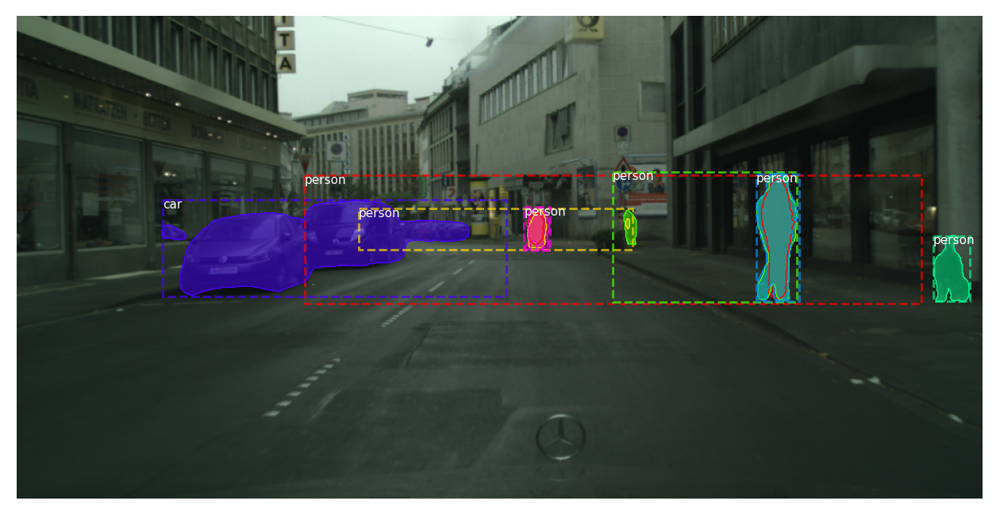

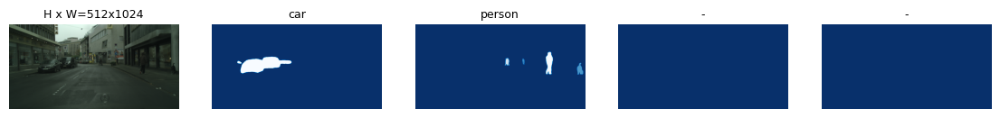

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
import torch
import torchvision.tv_tensors as tv_tensors
from torchvision.transforms import v2 as T
from torchvision.io import read_image
from torchvision.ops import masks_to_boxes
import numpy as np
import matplotlib.pyplot as plt
import cv2 # Used for drawing contours
import random


def visualize_predictions(model, dataset, idx=None, device='cuda', confidence_threshold=0.5):
    """
    Visualizes ground truth, predicted masks, and an overlay of both for a given sample.

    Args:
        model (torch.nn.Module): The trained Mask R-CNN model.
        dataset (Dataset): The Cityscapes dataset instance.
        idx (int, optional): The index of the sample to visualize. If None, a random index is chosen. Defaults to None.
        device (str, optional): The device to run inference on ('cuda' or 'cpu'). Defaults to 'cuda'.
        confidence_threshold (float, optional): The threshold to filter model predictions. Defaults to 0.5.
    """
    if idx is None:
        idx = random.randint(0, len(dataset) - 1)
    print(f"Visualizing sample at index: {idx}")

    # 1. Get Data and Run Inference
    model.to(device)
    model.eval()

    img, target = dataset[idx]
    
    with torch.no_grad():
        # Add a batch dimension and send to device
        model_input = img.unsqueeze(0).to(device)
        prediction = model(model_input)[0]

    # 2. Prepare Tensors for Visualization (move to CPU and convert to NumPy)
    # Convert image tensor from [C, H, W] to [H, W, C] for plotting
    img = T.Resize((512, 1024))(read_image(dataset.images[idx]))
    img_np = img.permute(1, 2, 0).cpu().numpy().astype(np.uint8)

    # Ground Truth data
    gt_masks = target['masks'].cpu().numpy()
    gt_labels = target['labels'].cpu().numpy()
    print(gt_labels.shape)

    # Prediction data
    pred_scores = prediction['scores'].cpu().numpy()
    high_conf_indices = np.where(pred_scores >= confidence_threshold)[0]

    # Filter predictions based on the confidence threshold
    pred_masks = (prediction['masks'][high_conf_indices] > 0.5).squeeze(1).permute(1, 2, 0).cpu().numpy()
    pred_labels = prediction['labels'][high_conf_indices].cpu().numpy()
    pred_boxes = prediction['boxes'][high_conf_indices].cpu().numpy()
    # need to swap because the display_instances is written by a fucking maniac
    for i in range(len(pred_boxes)):
        pred_boxes[i][0], pred_boxes[i][1] = pred_boxes[i][1], pred_boxes[i][0] # (y1, x1) instead of (x1, y1)
        pred_boxes[i][2], pred_boxes[i][3] = pred_boxes[i][3], pred_boxes[i][2] # (y2, x2) instead of (x2, y2)
    print("Boxes: ", pred_boxes)
    # print(pred_labels.shape)

    # print(dataset.class_names)
    plt.figure(figsize=(16,8))
    # mask_viz = convert_instance_to_semantic(target['masks'], target['labels'])
    # plt.imshow(mask_viz)
    display_instances(img_np, pred_boxes, pred_masks, pred_labels, class_names)
    # ax_overlay.imshow(overlay_display.astype(np.uint8))
    # ax_overlay.set_title("Overlay (GT: Fill, Prediction: Outline)")
    # ax_overlay.axis('off')
    plt.tight_layout()
    plt.show()
    plt.savefig("/kaggle/working/MaskRCNN_9c_5e.png")

test_dataset_for_viz = CityscapesDataset(path_cfg, val_augmentation_maskrcnn, split='train')
colors = torch.tensor(colors, dtype=torch.uint8)
print(colors.shape)
visualize_predictions(maskrcnn_model, test_dataset_for_viz, device='cuda', confidence_threshold=0.5)